In [1]:
# Add the parent directory to sys.path
import sys
sys.path.insert(0, '..')

In [44]:
!pip install setuptools wheel

# See https://github.com/lyst/lightfm/pull/661
!python -m pip install --no-use-pep517 lightfm

# Get a LightFM model trained up

## Load dataset from file

The data is currently extracted by `extract_recommender_training_data` task in chatbond-api. The data being extremelly sparse in question-user interactions, a collaborative filter, for now, seems useless.

In [76]:
import csv
import os

def load_csv_file(file_path):
    with open(file_path, "r") as csvfile:
        reader = csv.reader(csvfile)
        data = list(reader)
    return data

def load_training_data_from_directory(directory_path):
    # Load user_ids from CSV
    user_ids_file = os.path.join(directory_path, "user_ids.csv")
    user_ids = load_csv_file(user_ids_file)
    user_ids = [row[0] for row in user_ids]

    # Load question_ids_and_content from CSV
    questions_data_file = os.path.join(directory_path, "questions_data.csv")
    questions_data = load_csv_file(questions_data_file)

    # Load interactions_data from CSV
    interactions_data_file = os.path.join(directory_path, "interactions_data.csv")
    interactions_data = load_csv_file(interactions_data_file)

    return user_ids, questions_data, interactions_data

In [77]:
directory_path = '../data/recommender_training_data/2023-05-20_16-54-37'

user_ids, questions_data, interactions_data = load_training_data_from_directory(directory_path)

## Format dataset for expected model input format

In [78]:
# Remove "user_ids" header
user_ids = user_ids[1:] 

question_id_and_features = [(x[0], x[2]) for x in questions_data]

# Remove header and keep only IDs
question_ids = [x[0] for x in questions_data[1:]]

# Remove header
interactions_data = interactions_data[1:]

In [149]:
# Convert the string representation of floats to actual float values
for sublist in interactions_data:
    sublist[2] = float(sublist[2])

In [150]:
import ast

item_features_data = []
for id_and_embedding in question_id_and_features[1:]:
    # Get the question's embedding as a list.
    embedding = id_and_embedding[1]
    # Remove leading/trailing spaces and square brackets
    string_representation = embedding.strip("[]")
    float_list = ast.literal_eval(string_representation)

    # # Create a dictionary mapping each dimension to its corresponding value in the embedding.
    # features = {f"feature_{index}": item for index, item in enumerate(embedding)}
    # Create a dictionary mapping each dimension to its corresponding value in the embedding.
    features = {f"feature_{i}": float_list[i] for i in range(len(float_list))}

    # Append a tuple with the question id and the features dictionary to the item_features_data list.
    item_features_data.append((id_and_embedding[0], features))

In [151]:
item_features_data

[('89fb9c04-3aa5-4f37-8067-207fe4f34595',
  {'feature_0': 0.04165538400411606,
   'feature_1': 0.006750240456312895,
   'feature_2': 0.021014990285038948,
   'feature_3': -0.10221516340970993,
   'feature_4': 0.02473711594939232,
   'feature_5': 0.0630297064781189,
   'feature_6': -0.07042951136827469,
   'feature_7': -0.03338035196065903,
   'feature_8': 0.002840761560946703,
   'feature_9': 0.031058210879564285,
   'feature_10': 0.10688690841197968,
   'feature_11': -0.009740098379552364,
   'feature_12': -0.061309896409511566,
   'feature_13': -0.03192957118153572,
   'feature_14': -0.019000165164470673,
   'feature_15': -0.0007079302449710667,
   'feature_16': 0.0434330590069294,
   'feature_17': 0.0344572551548481,
   'feature_18': -0.01591942273080349,
   'feature_19': -0.00895787961781025,
   'feature_20': -0.04859702289104462,
   'feature_21': 0.07643182575702667,
   'feature_22': 0.03504564240574837,
   'feature_23': -0.0251039769500494,
   'feature_24': 0.009285260923206806,


## Create model 

In [95]:
from lightfm import LightFM, data

# Create a LightFM dataset instance
dataset = data.Dataset(user_identity_features=True, item_identity_features=True)

# Get the dimensions of embeddings
n_features = len(ast.literal_eval(id_and_embedding[1]))

# Create list of feature names
feature_names = [f"feature_{i}" for i in range(n_features)]

# Add feature_names to item_feature argument in the fit method
dataset.fit(users=user_ids, items=question_ids, item_features=feature_names)

# Assume interactions_data is a list of tuples where each tuple represents an interaction
(interactions, weights) = dataset.build_interactions(interactions_data)

# Assume item_features_data is a list of tuples where each tuple represents an item and its features
item_features = dataset.build_item_features(item_features_data)

# Create a model instance. 'warp' is one of the loss functions provided by LightFM
model = LightFM(loss="logistic", no_components=20)

In [96]:
# Train the model
# model.fit(interactions, item_features=item_features, epochs=30, num_threads=4)

# Optionally, you can also use the weights when fitting the model.
model.fit(
    interactions,
    item_features=item_features,
    sample_weight=weights,
    epochs=30,
    num_threads=4,
)

# Play around with training

In [106]:
from lightfm.evaluation import precision_at_k
from lightfm.cross_validation import random_train_test_split

# Split the interactions and weights into train and test sets
train_interactions, test_interactions = random_train_test_split(interactions, test_percentage=0.2, random_state=42)
train_weights, test_weights = random_train_test_split(weights, test_percentage=0.2, random_state=42)


## Adagrad vs Adelta

### Logistic loss

In [178]:
%matplotlib inline

import matplotlib
import numpy as np
import matplotlib.pyplot as plt

def adagrad_vs_adelta(loss, train_interactions, test_interactions, train_weights, test_weights):
    alpha = 1e-3
    epochs = 70
    NUM_THREADS = 3

    adagrad_model = LightFM(no_components=30,
                            loss=loss,
                            learning_schedule='adagrad',
                            user_alpha=alpha,
                            item_alpha=alpha)
    adadelta_model = LightFM(no_components=30,
                            loss=loss,
                            learning_schedule='adadelta',
                            user_alpha=alpha,
                            item_alpha=alpha)

    from lightfm.evaluation import auc_score

    adagrad_auc = []

    for epoch in range(epochs):
        adagrad_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
        adagrad_auc.append(auc_score(adagrad_model, test_interactions).mean())


    adadelta_auc = []

    for epoch in range(epochs):
        adadelta_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
        adadelta_auc.append(auc_score(adadelta_model, test_interactions).mean())

    x = np.arange(len(adagrad_auc))
    plt.plot(x, np.array(adagrad_auc))
    plt.plot(x, np.array(adadelta_auc))
    plt.legend(['adagrad', 'adadelta'], loc='lower right')
    plt.show()

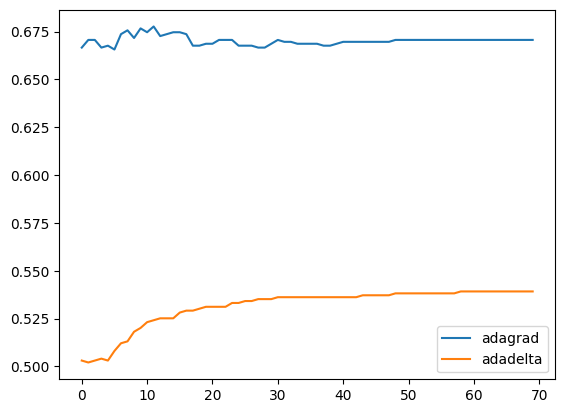

In [180]:
adagrad_vs_adelta('logistic', train_interactions, test_interactions, train_weights, test_weights)

## Warp

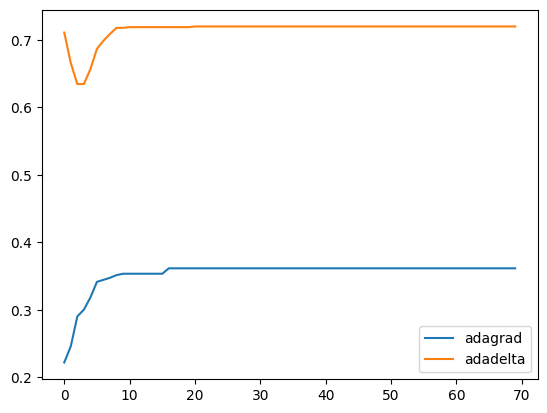

In [181]:
adagrad_vs_adelta('warp', train_interactions, test_interactions, train_weights, test_weights)

## Warp-KOS

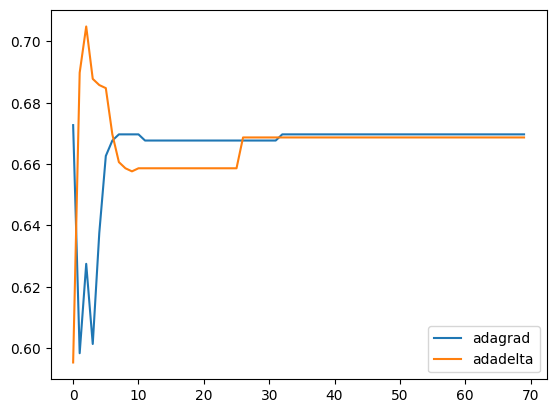

In [182]:
adagrad_vs_adelta('warp-kos', train_interactions, test_interactions, train_weights, test_weights)

# Reduce dimensionality

In [162]:
from umap import UMAP

embeddings = []

for id_and_embedding in question_id_and_features[1:]:
    # Get the question's embedding as a list.
    embedding = id_and_embedding[1]
    # Remove leading/trailing spaces and square brackets
    string_representation = embedding.strip("[]")
    float_list = ast.literal_eval(string_representation)
    embeddings.append(float_list)

# Current dimension should be 768
print(f"Original data has embeddings of dimentionality {len(embeddings[0])}")

Original data has embeddings of dimentionality 768


In [167]:
from umap import UMAP

embeddings_reduced_dimensionality = []

for id_and_embedding in question_id_and_features[1:]:
    # Get the question's embedding as a list.
    embedding = id_and_embedding[1]
    # Remove leading/trailing spaces and square brackets
    string_representation = embedding.strip("[]")
    float_list = ast.literal_eval(string_representation)
    embeddings_reduced_dimensionality.append(float_list)

# Choose the number of components for UMAP
n_components = 50  # This can be any number less than the original number of features

# Create a UMAP instance
umap = UMAP(n_components=n_components)

# Apply UMAP
umap_embeddings = umap.fit_transform(embeddings_reduced_dimensionality)

# Now, each item in umap_embeddings is a 50-dimensional vector
print(f"UMAP reduced dimensionality to {len(umap_embeddings[0])}-dimensional vectors")

UMAP reduced dimensionality to 50-dimensional vectors


In [168]:
umap_embeddings[0]

array([ 8.304334 , 10.142285 ,  8.095615 ,  6.404985 ,  5.844779 ,
        5.5223203,  1.6356167,  4.8922286,  3.86352  ,  6.881194 ,
        1.6627504,  6.9875154,  4.458362 ,  5.9374504,  4.753836 ,
        6.9899   ,  4.9463696,  6.9307504,  7.2754726,  6.7534866,
        3.4666843,  5.9067144,  6.064581 ,  6.4200544,  3.2146382,
        4.295896 ,  4.501567 ,  4.3457146,  3.9762042,  5.203946 ,
        3.7932117,  7.657362 ,  5.892827 ,  2.9030142,  5.520309 ,
        6.0252833,  2.410263 ,  6.007094 ,  5.3314595,  6.8524637,
        5.4069924,  5.4880147,  5.042832 ,  4.53249  ,  5.5691915,
        7.133922 ,  3.4157755,  6.279065 ,  4.6700892,  6.497961 ],
      dtype=float32)

In [175]:
reduced_item_features_data = []

for i, id_and_embedding in enumerate(question_id_and_features[1:]):
    embedding = umap_embeddings[i]
    # # Create a dictionary mapping each dimension to its corresponding value in the embedding.
    # features = {f"feature_{index}": item for index, item in enumerate(embedding)}
    # Create a dictionary mapping each dimension to its corresponding value in the embedding.
    features = {f"feature_{k}": embedding[k] for k in range(len(embedding))}

    # Append a tuple with the question id and the features dictionary to the item_features_data list.
    reduced_item_features_data.append((id_and_embedding[0], features))

## Try on models

In [185]:
# Create a LightFM dataset instance
dataset = data.Dataset(user_identity_features=True, item_identity_features=True)

# Get the dimensions of embeddings
n_features = n_components # From UMAP

# Create list of feature names
feature_names = [f"feature_{i}" for i in range(n_features)]

# Add feature_names to item_feature argument in the fit method
dataset.fit(users=user_ids, items=question_ids, item_features=feature_names)

# Assume interactions_data is a list of tuples where each tuple represents an interaction
(interactions, weights) = dataset.build_interactions(interactions_data)

# Assume item_features_data is a list of tuples where each tuple represents an item and its features
item_features = dataset.build_item_features(reduced_item_features_data)

In [186]:
from lightfm.evaluation import precision_at_k
from lightfm.cross_validation import random_train_test_split

# Split the interactions and weights into train and test sets
train_interactions, test_interactions = random_train_test_split(interactions, test_percentage=0.2, random_state=42)
train_weights, test_weights = random_train_test_split(weights, test_percentage=0.2, random_state=42)


### Logistic

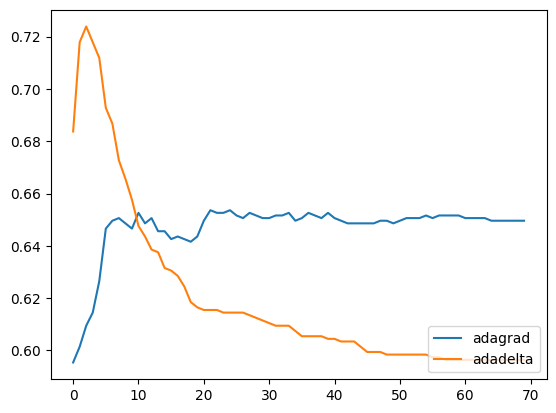

In [190]:
adagrad_vs_adelta('logistic', train_interactions, test_interactions, train_weights, test_weights)

### Warp

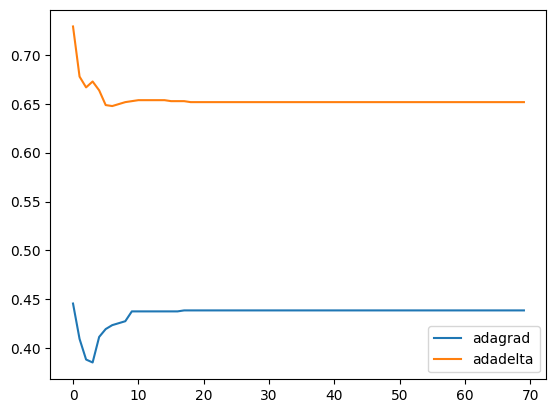

In [191]:
adagrad_vs_adelta('warp', train_interactions, test_interactions, train_weights, test_weights)

### Warp-KOS

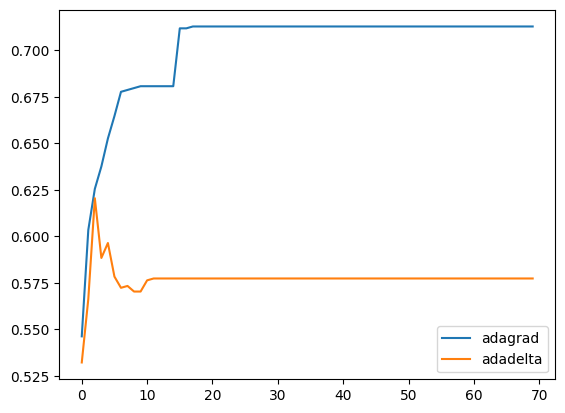

In [193]:
adagrad_vs_adelta('warp-kos', train_interactions, test_interactions, train_weights, test_weights)

## Average multiple instances of each model
It's all over the place...every time I train a new model, the results vary vastly. Based on my reading on the model, it's probably overfitting when it performs well since I have very sparse data.

In [197]:
def adagrad_vs_adelta(loss, train_interactions, test_interactions, train_weights, test_weights):
    alpha = 1e-3
    epochs = 70
    NUM_THREADS = 3
    num_runs = 30

    from lightfm.evaluation import auc_score

    adagrad_auc_runs = []
    adadelta_auc_runs = []

    for run in range(num_runs):

        adagrad_model = LightFM(no_components=30,
                                loss=loss,
                                learning_schedule='adagrad',
                                user_alpha=alpha,
                                item_alpha=alpha)
        adadelta_model = LightFM(no_components=30,
                                loss=loss,
                                learning_schedule='adadelta',
                                user_alpha=alpha,
                                item_alpha=alpha)

        adagrad_auc = []
        adadelta_auc = []

        for epoch in range(epochs):
            adagrad_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
            adagrad_auc.append(auc_score(adagrad_model, test_interactions).mean())
            
            adadelta_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
            adadelta_auc.append(auc_score(adadelta_model, test_interactions).mean())

        adagrad_auc_runs.append(adagrad_auc)
        adadelta_auc_runs.append(adadelta_auc)

    adagrad_avg_auc = np.mean(adagrad_auc_runs, axis=0)
    adadelta_avg_auc = np.mean(adadelta_auc_runs, axis=0)

    x = np.arange(len(adagrad_avg_auc))
    plt.plot(x, adagrad_avg_auc)
    plt.plot(x, adadelta_avg_auc)
    plt.legend(['adagrad', 'adadelta'], loc='lower right')
    plt.show()


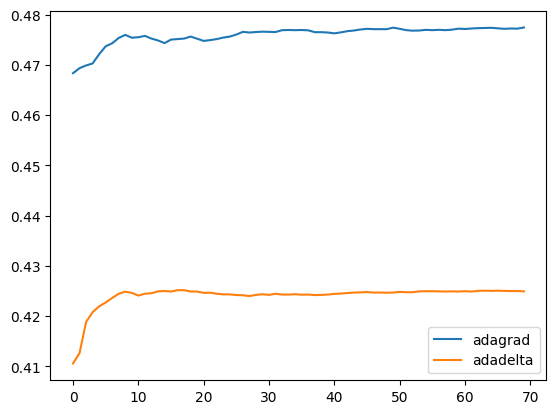

In [200]:
adagrad_vs_adelta('logistic', train_interactions, test_interactions, train_weights, test_weights)

In [201]:
import matplotlib.pyplot as plt

def adagrad_vs_adelta(loss, train_interactions, test_interactions, train_weights, test_weights, num_runs=20):
    alpha = 1e-3
    epochs = 70
    NUM_THREADS = 3

    from lightfm.evaluation import auc_score

    fig, axs = plt.subplots(2, 3, figsize=(15, 10)) # Adjust to your needs

    for i in range(2):
        for j in range(3):

            adagrad_auc_runs = []
            adadelta_auc_runs = []

            for run in range(num_runs):

                adagrad_model = LightFM(no_components=30,
                                        loss=loss,
                                        learning_schedule='adagrad',
                                        user_alpha=alpha,
                                        item_alpha=alpha)
                adadelta_model = LightFM(no_components=30,
                                        loss=loss,
                                        learning_schedule='adadelta',
                                        user_alpha=alpha,
                                        item_alpha=alpha)

                adagrad_auc = []
                adadelta_auc = []

                for epoch in range(epochs):
                    adagrad_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
                    adagrad_auc.append(auc_score(adagrad_model, test_interactions).mean())

                    adadelta_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
                    adadelta_auc.append(auc_score(adadelta_model, test_interactions).mean())

                adagrad_auc_runs.append(adagrad_auc)
                adadelta_auc_runs.append(adadelta_auc)

            adagrad_avg_auc = np.mean(adagrad_auc_runs, axis=0)
            adadelta_avg_auc = np.mean(adadelta_auc_runs, axis=0)

            x = np.arange(len(adagrad_avg_auc))
            axs[i, j].plot(x, adagrad_avg_auc, label='adagrad')
            axs[i, j].plot(x, adadelta_avg_auc, label='adadelta')
            axs[i, j].legend(loc='lower right')
            axs[i, j].set_title(f'Run {3*i+j+1}')

    plt.tight_layout()
    plt.show()


The below graphs average 20 runs per graph for each of adagrad or adelta. My data is definitely shit for now. Let's just go with k-nearest until I have some better quality data.

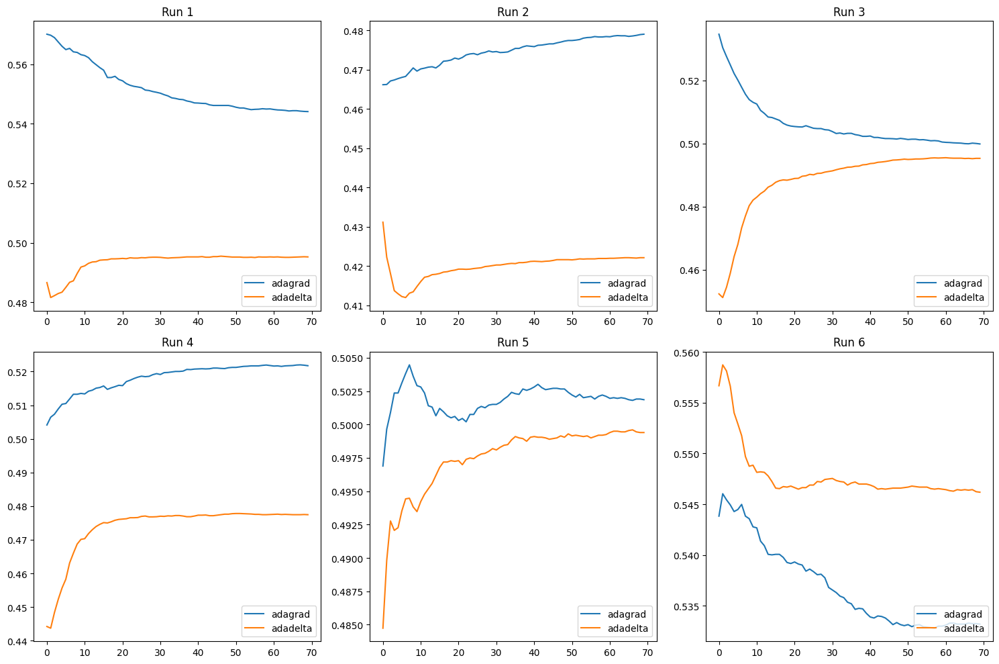

In [202]:
adagrad_vs_adelta('logistic', train_interactions, test_interactions, train_weights, test_weights)

In [203]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def adagrad_vs_adelta(loss, train_interactions, test_interactions, train_weights, test_weights, num_runs=20):
    alpha = 1e-3
    epochs = 70
    NUM_THREADS = 3

    from lightfm.evaluation import auc_score

    fig = make_subplots(rows=2, cols=3, subplot_titles=[f"Run {i}" for i in range(1, 7)])

    for i in range(2):
        for j in range(3):

            adagrad_auc_runs = []
            adadelta_auc_runs = []

            for run in range(num_runs):

                adagrad_model = LightFM(no_components=30,
                                        loss=loss,
                                        learning_schedule='adagrad',
                                        user_alpha=alpha,
                                        item_alpha=alpha)
                adadelta_model = LightFM(no_components=30,
                                        loss=loss,
                                        learning_schedule='adadelta',
                                        user_alpha=alpha,
                                        item_alpha=alpha)

                adagrad_auc = []
                adadelta_auc = []

                for epoch in range(epochs):
                    adagrad_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
                    adagrad_auc.append(auc_score(adagrad_model, test_interactions).mean())

                    adadelta_model.fit_partial(train_interactions, epochs=1, num_threads=NUM_THREADS)
                    adadelta_auc.append(auc_score(adadelta_model, test_interactions).mean())

                adagrad_auc_runs.append(adagrad_auc)
                adadelta_auc_runs.append(adadelta_auc)

            adagrad_avg_auc = np.mean(adagrad_auc_runs, axis=0)
            adadelta_avg_auc = np.mean(adadelta_auc_runs, axis=0)

            x = np.arange(len(adagrad_avg_auc))
            fig.add_trace(go.Scatter(x=x, y=adagrad_avg_auc, mode='lines', name='adagrad'), row=i+1, col=j+1)
            fig.add_trace(go.Scatter(x=x, y=adadelta_avg_auc, mode='lines', name='adadelta'), row=i+1, col=j+1)

    fig.update_layout(height=600, width=900, title_text="Adagrad vs Adadelta")
    fig.show()


In [205]:
adagrad_vs_adelta('logistic', train_interactions, test_interactions, train_weights, test_weights)

# Test ANN model